# !!! GITHUB !!!

https://github.com/boyfromasia/SegmentationSpoonsForks

# Mask RCNN training

## Install Roboflow and Detectron2 Dependencies

In [ ]:
!python -m pip install roboflow
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [1]:
import logging
import torch
from collections import OrderedDict
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.utils.events import EventStorage
from detectron2.modeling import build_model
import detectron2.utils.comm as comm
from detectron2.engine import default_argument_parser, default_setup, default_writers, launch
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)

from roboflow import Roboflow

from matplotlib import pyplot as plt
from PIL import Image

## Download dataset via Roboflow

In [2]:
rf = Roboflow(api_key="123")
project = rf.workspace("aml-m7pfg").project("fork-spoon-segm")
dataset = project.version(2).download("coco")
VERSION = 2

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to fork-spoon-segm-2 in coco:: 100%|██████████| 254/254 [00:00<00:00, 1032.74it/s]


In [38]:
register_coco_instances("my_dataset_train", {},  f"./fork-spoon-segm-{VERSION}/train/_annotations.coco.json", f"./fork-spoon-segm-{VERSION}/train/")
register_coco_instances("my_dataset_val", {}, f"./fork-spoon-segm-{VERSION}/valid/_annotations.coco.json", f"./fork-spoon-segm-{VERSION}/valid/")
register_coco_instances("my_dataset_test", {}, f"./fork-spoon-segm-{VERSION}/test/_annotations.coco.json", f"./fork-spoon-segm-{VERSION}/test/")


WARNING [04/25 22:15:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/25 22:15:32 d2.data.datasets.coco]: Loaded 214 images in COCO format from ./fork-spoon-segm-2/train/_annotations.coco.json


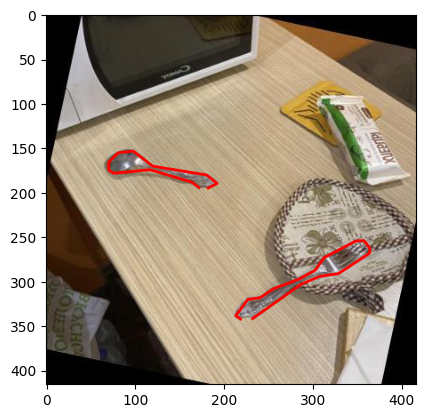

In [39]:
dataset_train = DatasetCatalog.get("my_dataset_train")
fig, ax = plt.subplots()
dataset_dict = random.choice(dataset_train)
im = Image.open(dataset_dict['file_name'])
ax.imshow(im)
for ann in dataset_dict['annotations']:
    for poly in ann['segmentation']:
        x = poly[0::2]
        y = poly[1::2]
        ax.plot(x,y, linewidth=2, color='red')

## Train custom Mask RCNN Segmentator



In [46]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)#Train dataset registered in a previous cell
cfg.DATASETS.TEST = ("my_dataset_val",)#Test dataset registered in a previous cell
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500 #We found that with a patience of 500, training will early stop before 10,000 iterations
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 # 26 letters plus one super class
cfg.TEST.EVAL_PERIOD = 200# Increase this number if you want to monitor validation performance during training

PATIENCE = 500 #Early stopping will occur after N iterations of no imporovement in total_loss

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [47]:
def get_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky if-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, output_dir=output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        return CityscapesSemSegEvaluator(dataset_name)
    if evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    if evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, cfg, True, output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    if len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

def do_test(cfg, model):
    results = OrderedDict()
    for dataset_name in cfg.DATASETS.TEST:
        data_loader = build_detection_test_loader(cfg, dataset_name)
        evaluator = get_evaluator(
            cfg, dataset_name, os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
        )
        results_i = inference_on_dataset(model, data_loader, evaluator)
        results[dataset_name] = results_i
        if comm.is_main_process():
            logger.info("Evaluation results for {} in csv format:".format(dataset_name))
            print_csv_format(results_i)
    if len(results) == 1:
        results = list(results.values())[0]
    return results


logger = logging.getLogger("detectron2")
resume=False
model = build_model(cfg)
optimizer = build_optimizer(cfg, model)
scheduler = build_lr_scheduler(cfg, optimizer)

BEST_LOSS = np.inf

checkpointer = DetectionCheckpointer(
    model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
)
start_iter = (
    checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
)
prev_iter = start_iter
max_iter = cfg.SOLVER.MAX_ITER

periodic_checkpointer = PeriodicCheckpointer(
    checkpointer, cfg.SOLVER.CHECKPOINT_PERIOD, max_iter=max_iter
)

writers = default_writers(cfg.OUTPUT_DIR, max_iter) if comm.is_main_process() else []

# compared to "train_net.py", we do not support accurate timing and
# precise BN here, because they are not trivial to implement in a small training loop
data_loader = build_detection_train_loader(cfg)
logger.info("Starting training from iteration {}".format(start_iter))
patience_counter = 0
with EventStorage(start_iter) as storage:
    for data, iteration in zip(data_loader, range(start_iter, max_iter)):
        storage.iter = iteration
        try:
            loss_dict = model(data)
        except:
            continue
        losses = sum(loss_dict.values())
        assert torch.isfinite(losses).all(), loss_dict

        loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())
        if comm.is_main_process():
            storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
        scheduler.step()

        if (
            cfg.TEST.EVAL_PERIOD > 0
            and (iteration + 1) % cfg.TEST.EVAL_PERIOD == 0
            and iteration != max_iter - 1
        ):
            do_test(cfg, model)
            # Compared to "train_net.py", the test results are not dumped to EventStorage
            comm.synchronize()

        if iteration - start_iter > 5 and (
            (iteration + 1) % 20 == 0 or iteration == max_iter - 1
        ):
            for writer in writers:
                writer.write()
        periodic_checkpointer.step(iteration)
        
        if iteration > prev_iter:
            prev_iter = iteration
            if losses_reduced < BEST_LOSS:
                BEST_LOSS = losses_reduced
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter % 100 == 0:
                    print(f"Loss has not improved for {patience_counter} iterations")
                if patience_counter >= PATIENCE:
                    print(f"EARLY STOPPING")
                    break
                
do_test(cfg, model)

[04/25 22:22:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


WARNING [04/25 22:22:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/25 22:22:59 d2.data.datasets.coco]: Loaded 214 images in COCO format from ./fork-spoon-segm-2/train/_annotations.coco.json
[04/25 22:22:59 d2.data.build]: Removed 0 images with no usable annotations. 214 images left.
[04/25 22:22:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[04/25 22:22:59 d2.data.build]: Using training sampler TrainingSampler
[04/25 22:22:59 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[04/25 22:22:59 d2.data.common]: Serializing 214 elements to byte tensors and concatenating them all ...
[04/25 22:22:59 d2.data.common]: Serialized dataset takes 0.18 MiB
[04/25 22:22:59 detectron2]: Starting training from iteration 0
[04/

OrderedDict([('bbox',
              {'AP': 79.17764799018637,
               'AP50': 95.42669537540097,
               'AP75': 94.86390225398357,
               'APs': nan,
               'APm': 76.73978226628402,
               'APl': 86.08678670538521,
               'AP-fork-spoon': nan,
               'AP-fork': 76.53964772529459,
               'AP-spoon': 81.81564825507814}),
             ('segm',
              {'AP': 67.48554375122824,
               'AP50': 95.51591867513788,
               'AP75': 92.27036129369854,
               'APs': nan,
               'APm': 65.28125137714315,
               'APl': 75.64356435643565,
               'AP-fork-spoon': nan,
               'AP-fork': 62.740409761075746,
               'AP-spoon': 72.23067774138075})])

In [48]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Inference with Detectron2

[04/25 23:11:00 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


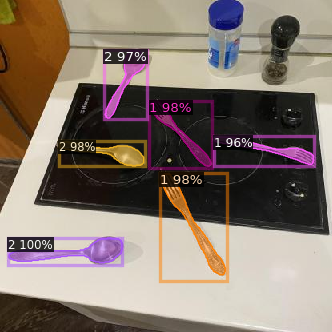

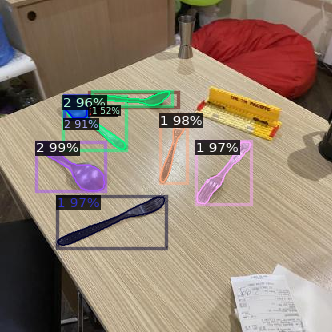

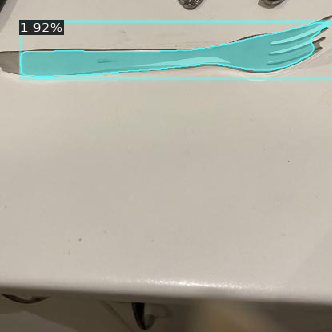

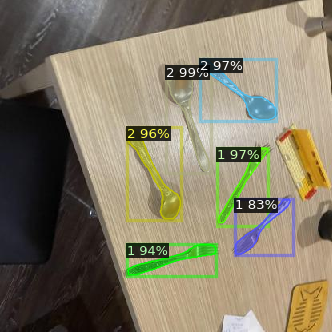

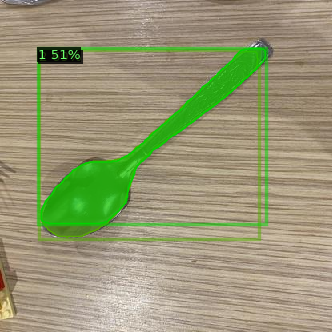

...

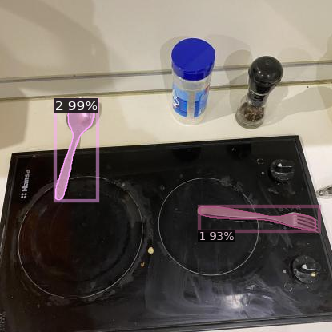

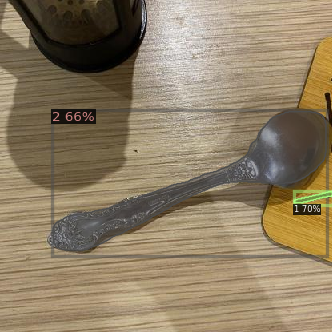

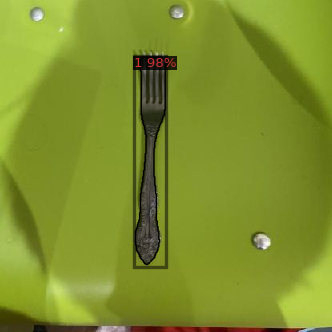

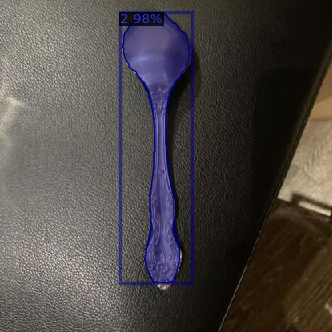

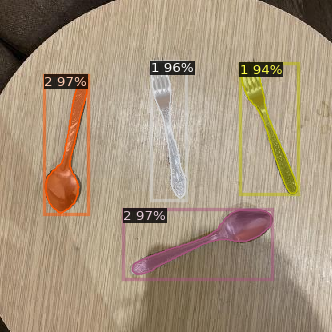

In [70]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob(f'/content/fork-spoon-segm-{VERSION}/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


## Save Weights

In [ ]:
from google.colab import files
files.download(os.path.join(cfg.OUTPUT_DIR, "model_final.pth"))

# YOLOv8 nano (smallest size) training

## Install ultralytics Dependencies

In [57]:
! rm /content/runs -r

In [50]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics

## Download dataset via Roboflow

In [ ]:
!curl -L "https://app.roboflow.com/ds/Ftur3mlUjk?key=123" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

## Train custom YoloV8 Segmentator


In [58]:
!yolo task=segment mode=train model=yolov8n-seg.pt data=/content/drive/MyDrive/Innopolis/Applied_Machine_Learning/Assignment_2/colab_yolo.yaml epochs=30 imgsz=416 plots=True

Ultralytics YOLOv8.0.87 🚀 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/Innopolis/Applied_Machine_Learning/Assignment_2/colab_yolo.yaml, epochs=30, patience=50, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torch

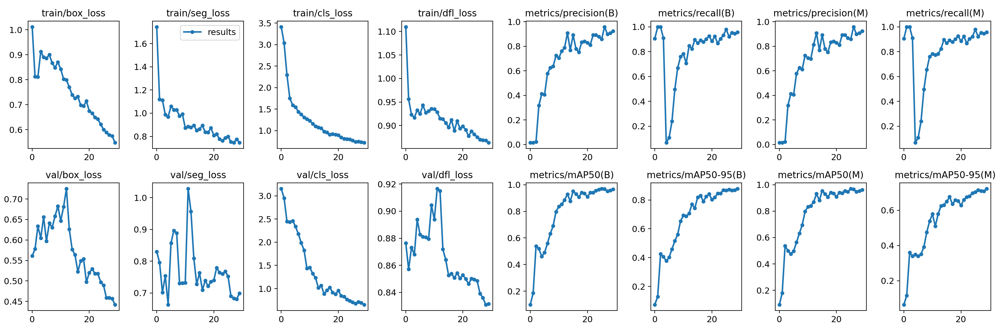

In [68]:
from IPython.display import Image
Image('/content/runs/segment/train/results.png')

## Save Weights

In [60]:
!scp -r /content/runs '/content/drive/MyDrive/Innopolis/Applied_Machine_Learning/Assignment_2'

## Inference with YoloV8 

In [66]:
!yolo task=segment mode=predict model=/content/drive/MyDrive/Innopolis/Applied_Machine_Learning/Assignment_2/runs/segment/train/weights/best.pt conf=0.7 source=/content/test/images save=True

Ultralytics YOLOv8.0.87 🚀 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258454 parameters, 0 gradients, 12.0 GFLOPs

image 1/11 /content/test/images/IMG_3132_jpg.rf.b33b2d78c3837586c8910dfdf9db083b.jpg: 416x416 2 forks, 4 spoons, 9.8ms
image 2/11 /content/test/images/IMG_3133_jpg.rf.72e0e8d22479e5a75e118807ba56c053.jpg: 416x416 3 forks, 1 spoon, 7.2ms
image 3/11 /content/test/images/IMG_3134_jpg.rf.8af42c9a98417cd08de2e3e66fc16b13.jpg: 416x416 1 fork, 1 spoon, 6.9ms
image 4/11 /content/test/images/IMG_3170_jpg.rf.bb698b4b650638a61a479656e86c030c.jpg: 416x416 1 fork, 6.9ms
image 5/11 /content/test/images/IMG_3175_jpg.rf.9e6731800c7f4a58b3f1cd2074ed6f1d.jpg: 416x416 1 fork, 6.9ms
image 6/11 /content/test/images/IMG_3191_jpg.rf.e2d119f49ce2a5ec1e69d1a686f436c9.jpg: 416x416 2 forks, 2 spoons, 6.9ms
image 7/11 /content/test/images/IMG_3209_jpg.rf.10eb57c5ef64f334e9b261fcfc39aa66.jpg: 416x416 1 fork, 1 spoon, 6.9ms
image 8/11 /content/t

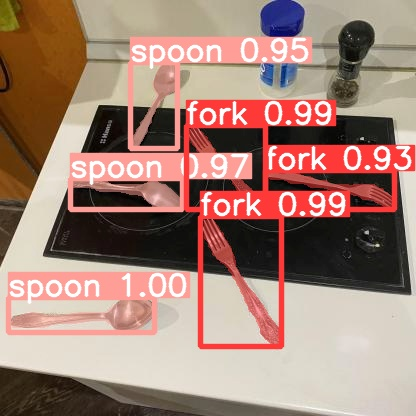

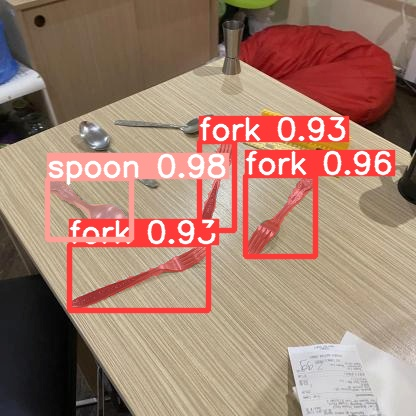

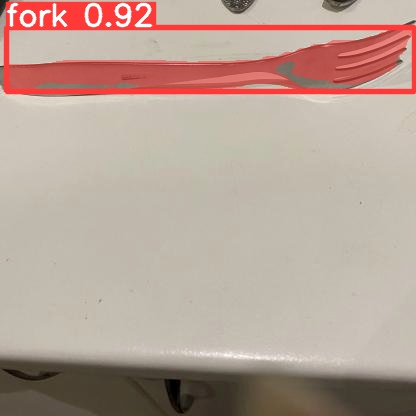

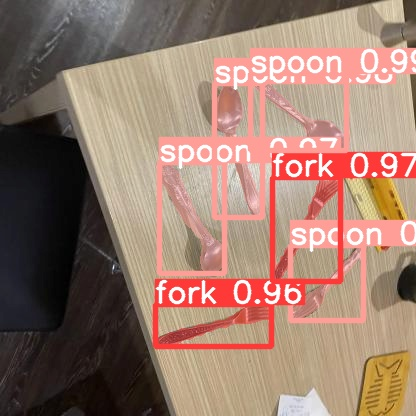

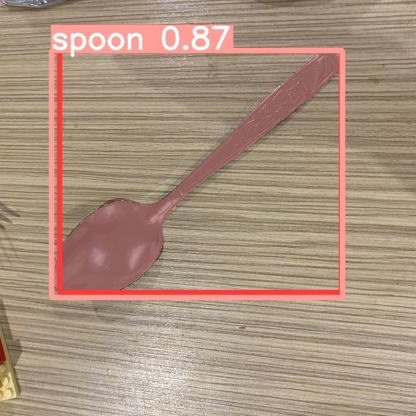

...

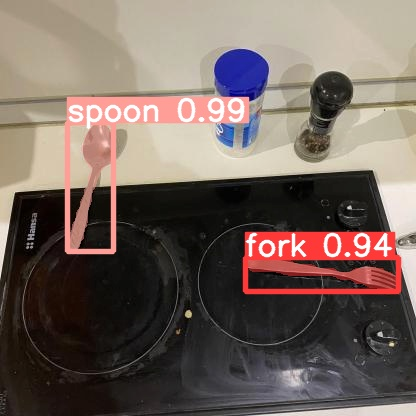

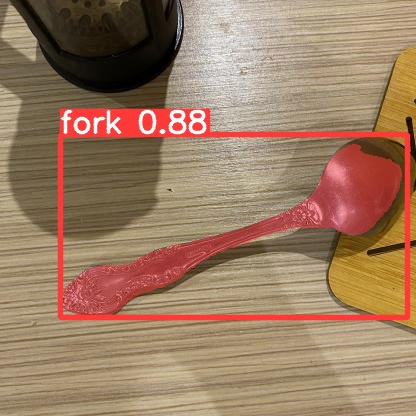

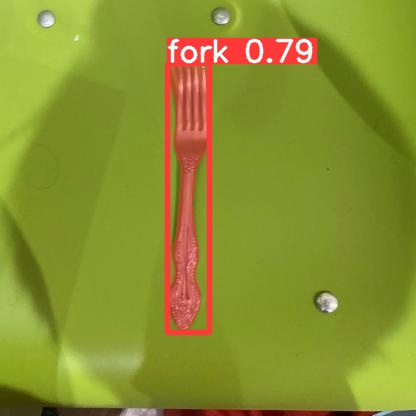

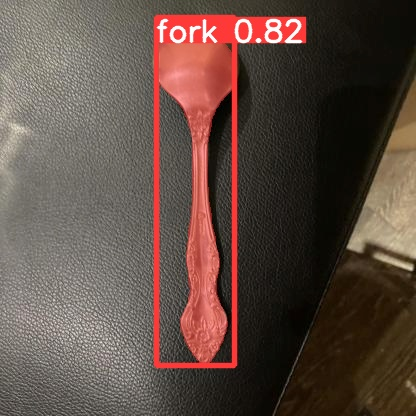

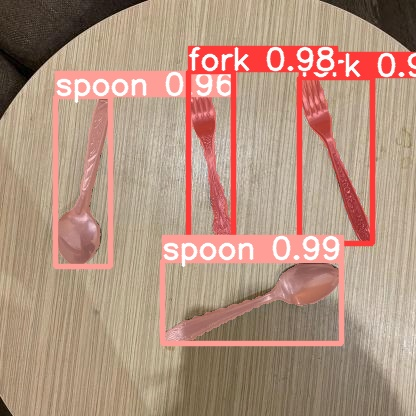

In [67]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/segment/predict2/*.jpg'):
      display(Image(filename=image_path, width=300))
      print("\n")

# Evaluating both models

Data:

1.   Train - 214 images
2.   Valid - 21 images
3.   Test - 11 images

## Conclusion

### Mask RCNN

```
Number of iterations - 500
Time of execution -  0:03:25
mAP@50 - 0.955
Image size - 416x416
Train memory - 3.4 GB

```

### YoloV8 nano
```
Number of epochs - 30
Time of execution - 0:04:35
mAP@50 - 0.963
Image size - 416x416
Train memory - 6.72 MB

```

So, as we can see, the result of YoloV8 Nano and Mask RCNN (R50-FPN3x) are very similar both in terms of training time and mAP@50. But the strong difference is that the smallest Yolo model take much less memory than the smallest Mask RCNN model.